<div class="alert alert-block alert-info">
<center><h1>ECE 143 Project</h1></center>
<h3><center>-- by <i>team 15</i></center></h3>
</div>

<div class="alert alert-block alert-warning"><b><h3>Prerequisites</h3></b> </div>

>- geopandas: 0.7.0
- bokeh: 1.4.0
- imageio: 2.8.0
- matplotlib: 3.1.3
- pandas: 1.0.1
- Holoviews: 1.12.7
- plotly: 1.0.1
- selenium: 3.14.1
- phantomjs: 2.1.1 (install from channel conda-forge)
- nbconvert
- pyecharts: 0.5.11
- seaborn: 0.9.0
- numpy: 1.16.5

<div class="alert alert-block alert-warning"><b><h3>Directory Organization</h3></b> </div>

>__src__<br>
- __DataProcessing__<br>
       -- all modules created by our team for preprocessing the data before ploting
- __plot__<br>
       -- all modules created by our team for ploting the graphs

>
>__Data__<br>
- __OriginalData__<br>
       -- original datasets we used for this projects
- __VisualizationData__<br>
       -- processed data we used for this projects
>
>__Image__<br>
- all images created by our team
>
- __Folders are divided into four subfolders correspond to the four parts we have done__<br>


<div class="alert alert-block alert-success">
<h2><center>Temperature map and its animation over years</center></h2>

</div>

# 1.1 generate temperature from 1850 to 2017 

In [1]:
import src.plots.TemperatureMap as tm
import os
import importlib
importlib.reload(tm)

# dependency required for export png
# https://docs.bokeh.org/en/latest/docs/user_guide/export.html
country_shape_directory = ""
plots_directory = "./Data/FinalData/TemperatureMaps/"
if not os.path.exists(plots_directory):
    os.makedirs(plots_directory)
for year in range(1850,2018):
    filename=plots_directory+str(year)+".png"
    if not os.path.exists(filename):
        tm.save_figure(year, filename)


# 1.2 plot the temperature of year 2008

In [2]:
tm.show_figure(2008)

Loading BokehJS ...

# 1.3generate the temperature map gif

In [3]:
gif_path = './Data/FinalData/temperature_map.gif'
tm.generate_gif(plots_directory, gif_path, start = 2000, end = 2018, step = 1, fps=2)
tm.show_gif(gif_path)

<div class="alert alert-block alert-success">
<h2><center>CO2 emission and temperature</center></h2>

</div>

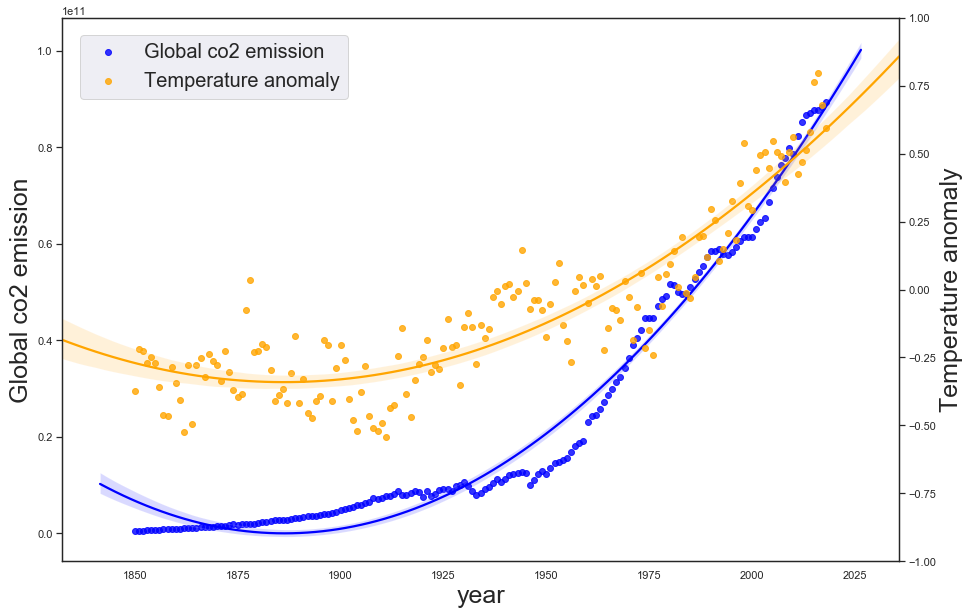

In [47]:
import sys
import os
sys.path.append('src\plots\CO2_GDP')
import plot_co2emission_tem
fileaddress = os.path.abspath(os.getcwd())
csvaddress = os.path.abspath(os.path.join(fileaddress, "Data\VisualizationData\CO2_GDP", "co2emission-temperature.csv"))
plot_co2emission_tem.plot(csvaddress)

<div class="alert alert-block alert-success">
<h2><center>CO2 emission and GDP for six countries</center></h2>

</div>

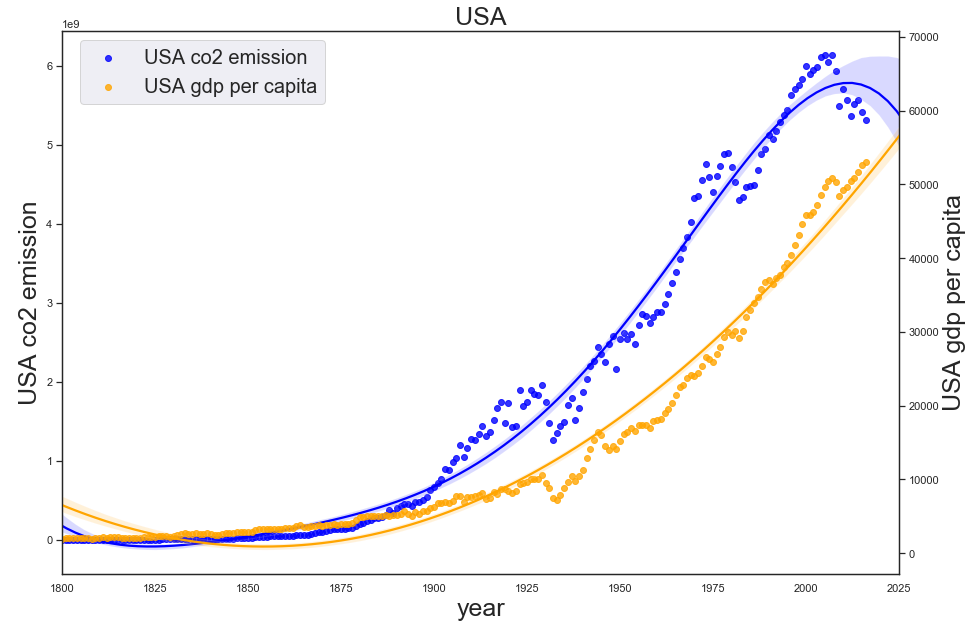

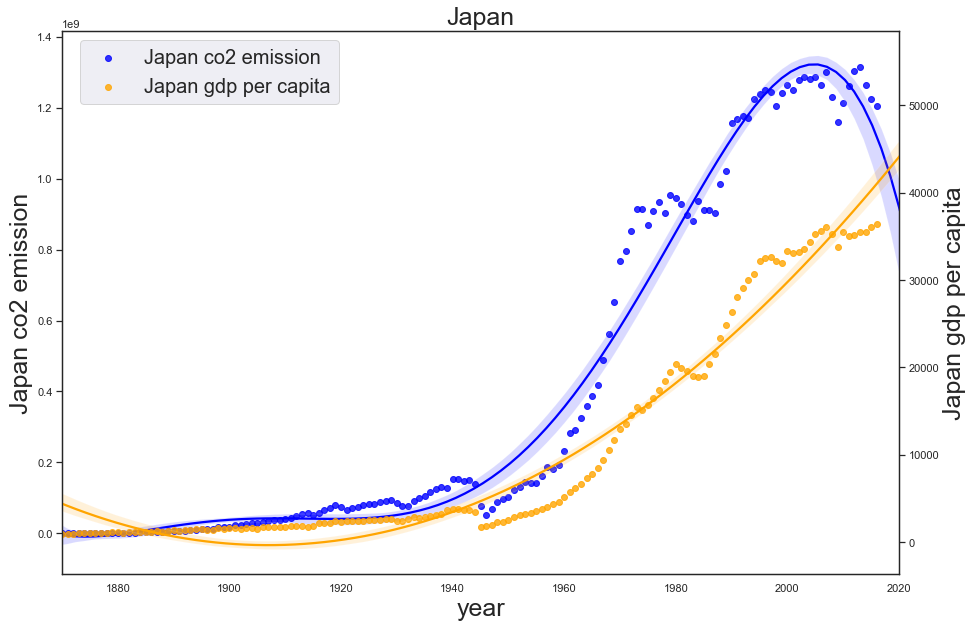

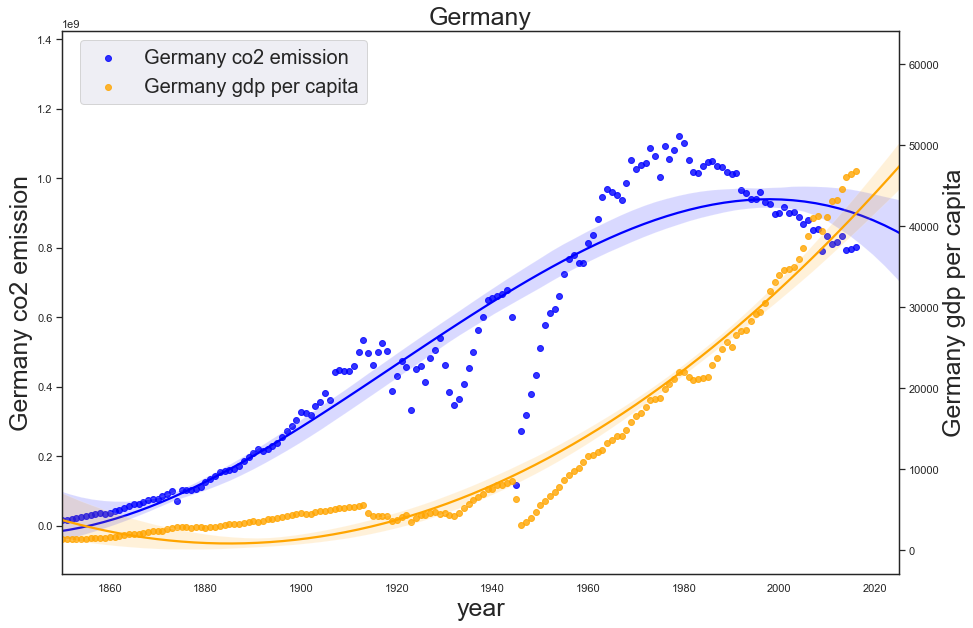

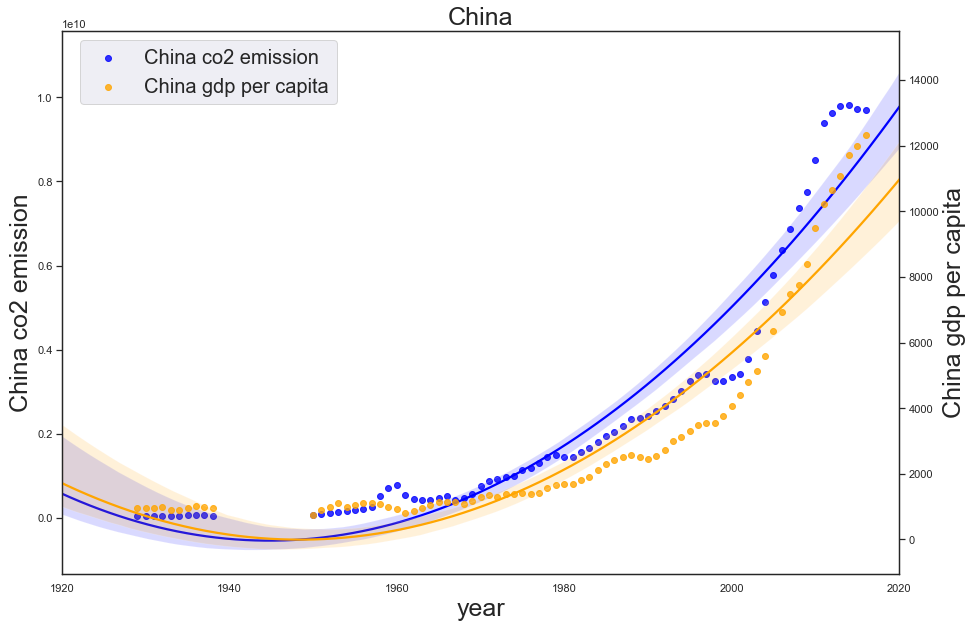

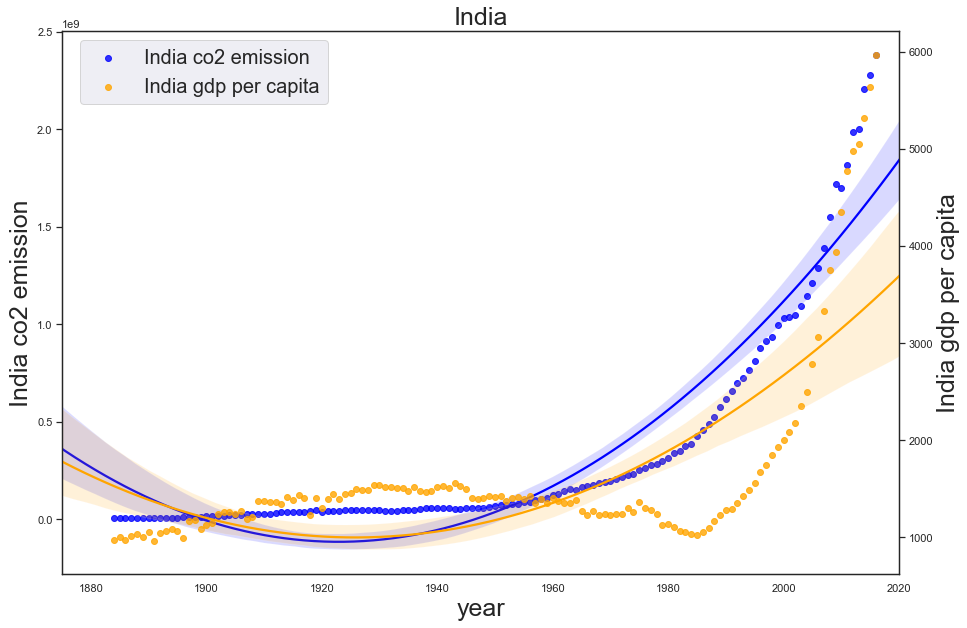

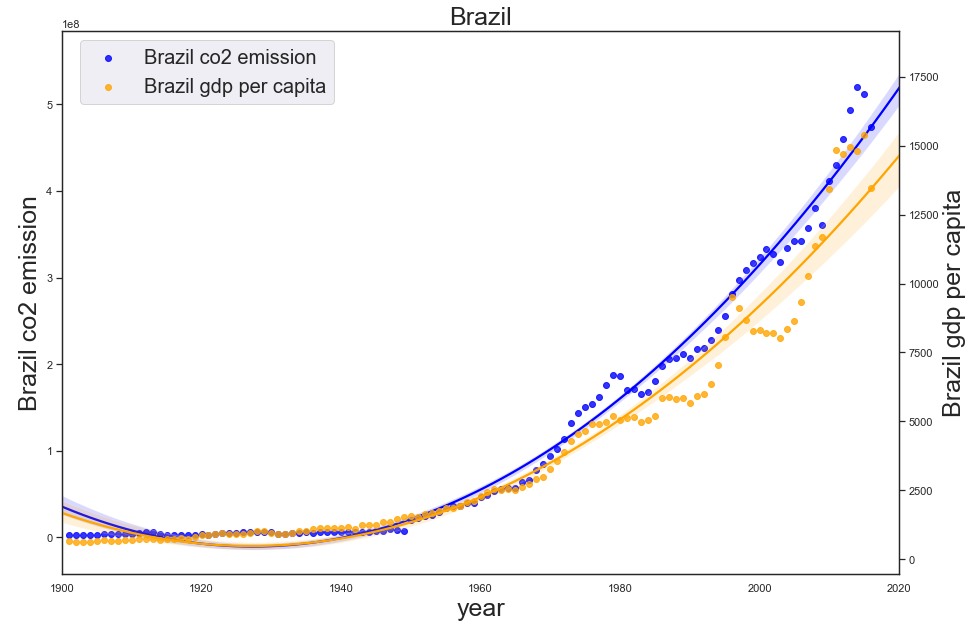

In [32]:
import country_trend_plot

countryname=["United States", "Japan", "Germany", "China", "India", "Brazil"]
for i in countryname:
    countrystr=i+"-co2-gdp.csv"
    csvaddress = os.path.abspath(os.path.join(fileaddress, "Data\VisualizationData\CO2_GDP", countrystr))
    country_trend_plot.plot(csvaddress, i)

<div class="alert alert-block alert-success">
<h2><center>Word cloud for correlation rate between CO2 emission and GDP </center></h2>

</div>

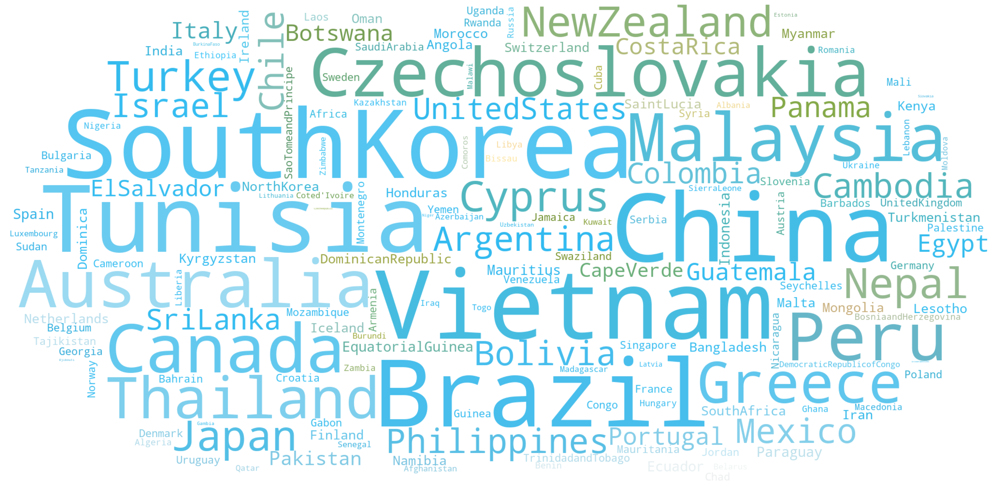

In [35]:
import word_cloud
txtaddress=os.path.abspath(os.path.join(fileaddress, 'Data\VisualizationData\CO2_GDP', 'wordcloud.txt'))
word_cloud.plot(txtaddress)

<div class="alert alert-block alert-success">
<h2><center>Scatter plot for correlation rate between CO2 emission and GDP </center></h2>

</div>

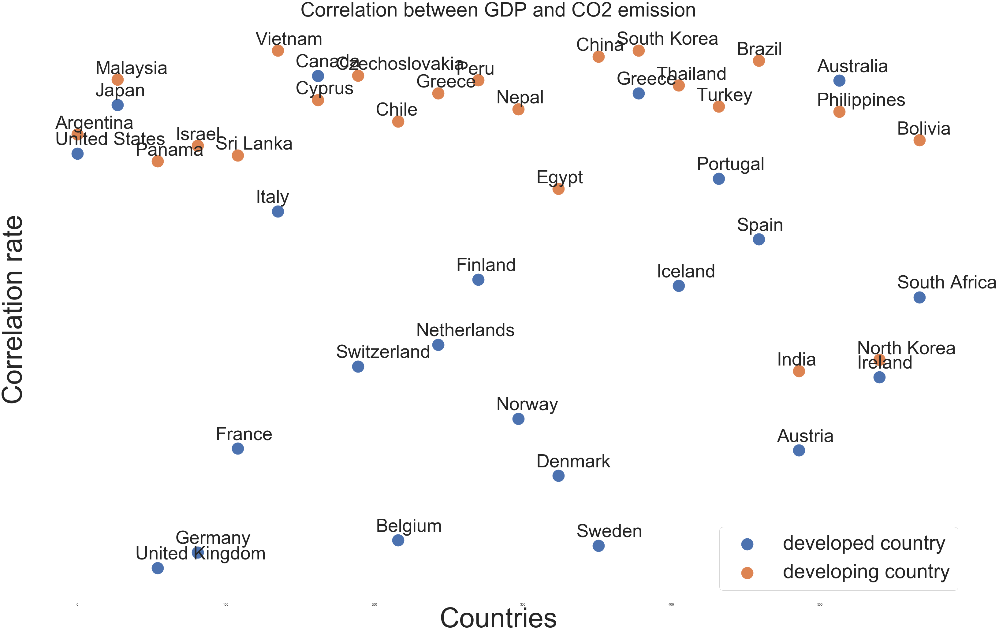

In [56]:
# plot the correlation rate between GDP and CO2 emission for each country
# if it doesn't show correctly, try to run it twice

import correlation_scatter_plot

developed=pd.read_csv(r"Data\VisualizationData\CO2_GDP\developed.csv")
developing=pd.read_csv(r"Data\VisualizationData\CO2_GDP\developing.csv")
correlation_scatter_plot.plot(developed, developing)

<div class="alert alert-block alert-success">
<h2><center>Tree map for CO2 emission per region and country</center></h2>

</div>

In [46]:
# see the treemap.html in Image/CO2_GDP
# It is an interactive image, you can zoom in or zoom out to see more details

import tree_map
import webbrowser
txtaddress=os.path.abspath(os.path.join(fileaddress, 'Data\VisualizationData\CO2_GDP', 'tree.txt'))
filepath=os.path.abspath(os.path.join(fileaddress, 'Image\CO2_GDP', 'treemap.html'))
tree_map.plot(txtaddress, filepath)
webbrowser.open(filepath)

True

<div class="alert alert-block alert-success">
<h2><center>CO2 emission per region</center></h2>

</div>

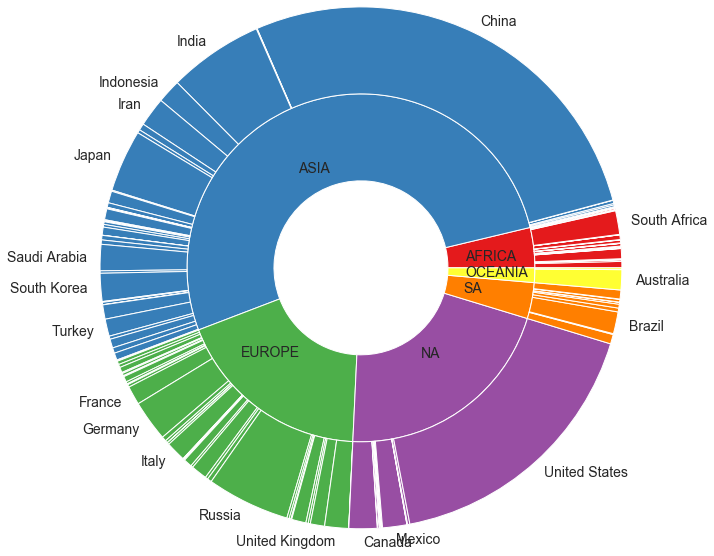

In [12]:
import matplotlib.pyplot as plt
plt.axis("equal")
layers = ['Continents','Countrys']
cmap = plt.get_cmap("Set1")

width = 1
values = list(x['value'] for x in tree)
labels = list(x['name'] for x in tree)
colors = cmap(range(len(labels)))
_=plt.pie(values, labels=labels, colors=colors, radius=2, 
          wedgeprops=dict(width=width, edgecolor='w'), labeldistance=.6,
         textprops={'fontsize': 14})
values = list(list(country['value'] for continent in tree for country in continent['children']))
labels = list(list(country['name'] for continent in tree for country in continent['children']))
countries_count = list(len(continent['children'])for continent in tree)
color_index = []
for i, count in enumerate(countries_count):
    color_index.extend([i]*count)
colors = cmap(color_index)
for i, value in enumerate(values):
    if value < 0.01:
        labels[i] = None

_=plt.pie(values, labels=labels, colors=colors, radius=3, 
          wedgeprops=dict(width=width, edgecolor='w'), labeldistance=1.05,
          textprops={'fontsize': 14}
         )
plt.show()

<div class="alert alert-block alert-success">
<h2><center>Factors that Could Warm the Earth</center></h2>

</div>

In [1]:
import sys
import os
import numpy as np
import pandas as pd
import plotly.graph_objs as go
sys.path.append('src/plots')

In [2]:
import FeatureVSObservedTemp

In [3]:
from FeatureVSObservedTemp import *

In [4]:
featuredata = pd.read_csv("Data/VisualizationData/TempFeature.csv")

In [10]:
plot_feature_VS_Observed('Solar', featuredata, 'green')

<div class="alert alert-block alert-success">
<h2><center>CO2 Adjusted By Trade</center></h2>

</div>

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
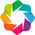

In [12]:
import numpy as np
import pandas as pd
import holoviews as hv
import hvplot.pandas
from holoviews.ipython.magics import OptsMagic
hv.extension('bokeh','matplotlib')

In [13]:
import Plot_Trade_CO2_Heatmap

In [14]:
from Plot_Trade_CO2_Heatmap import *

In [11]:
featuredata = pd.read_csv("Data/VisualizationData/HeatmapData.csv")

In [15]:
%opts HeatMap [colorbar=True,width=600,height=1500,xrotation=60,tools=['hover'], symmetric=True ]( cmap='RdYlBu')
plot_TradeCO2_heatmap(featuredata, 'netCO2')


:HeatMap   [Year,Entity]   (netCO2)

<div class="alert alert-block alert-success">
<h2><center>Mitigation Curves</center></h2>

</div>

In [1]:
from src.plots.Plots_2 import *

In [3]:
%matplotlib
plot_2_animation()

Using matplotlib backend: MacOSX


In [5]:
from IPython.display import HTML
HTML('<img src="Image/2 Degrees Mitigation.gif" width="750" align="center">')

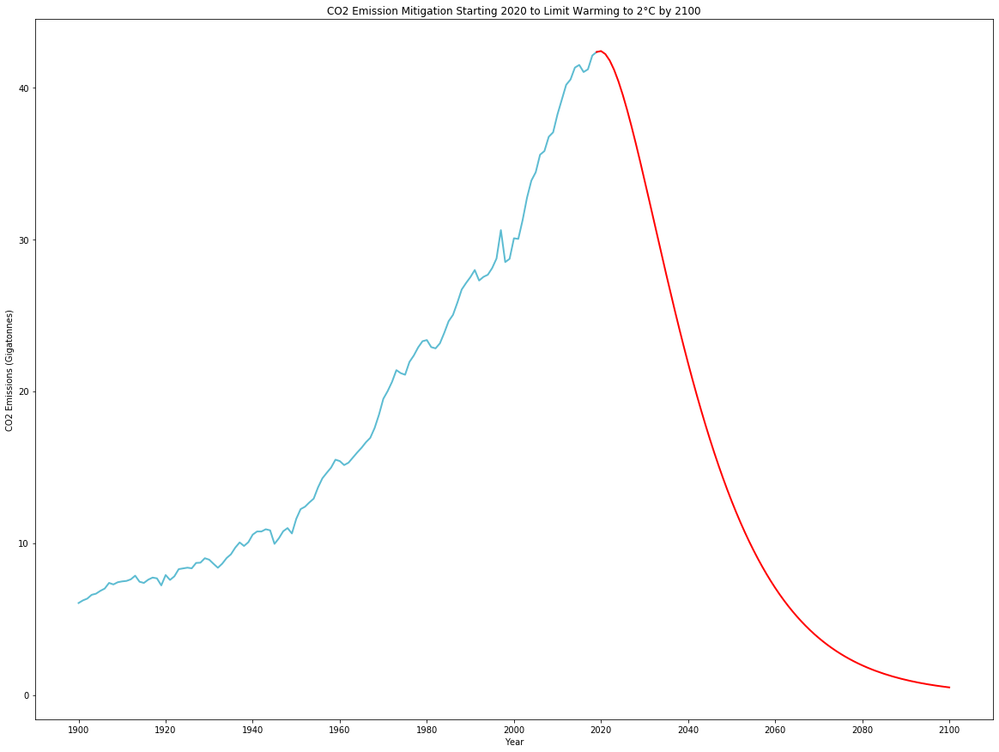

In [9]:
plot_2_2020()

In [10]:
from src.plots.Plots_1_5 import *

In [16]:
%matplotlib 
plot_1_5_animation()

Using matplotlib backend: MacOSX


In [6]:
from IPython.display import HTML
HTML('<img src="Image/1.5 Degrees Mitigation.gif" width="750" align="center">')

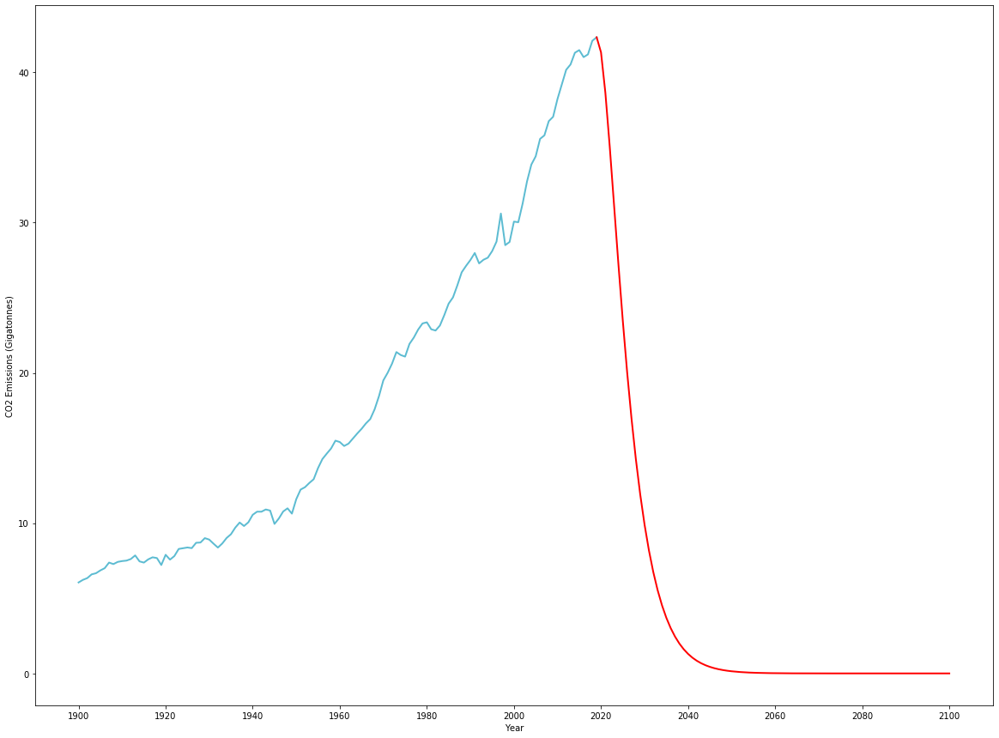

In [12]:
plot_1_5_2020()